# Embedding, Clustering & Annotation

In [1]:
# General
import scipy as sci
import numpy as np
import pandas as pd
import logging
import time
import pickle
from itertools import chain
import anndata as ad
import gc # Free memory #gc.collect()

# # Plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.colors as mcolors
from matplotlib import rcParams
from matplotlib import cm
import seaborn as sb
#from plotnine import *

# # Analysis
import scanpy as sc
import scanpy.external as sce
#import scvelo as scv
#import cellrank as cr

# Color Maps

In [2]:
from matplotlib.colors import ListedColormap

ch_YlRd=sb.cubehelix_palette(100, start=.7, rot=.25, gamma=0.6, hue=2, light=1, dark=0.05, as_cmap=True)
ch_Bl=sb.cubehelix_palette(100, start=2.65, rot=0, gamma=0.8, hue=1.8, light=1, dark=0, as_cmap=True)
ch_Bl2=sb.cubehelix_palette(100, start=2.75, rot=-.12, gamma=0.8, hue=1.8, light=1, dark=0, as_cmap=True)
ch_Bl2_2=sb.cubehelix_palette(100, start=2.75, rot=-.12, gamma=0.8, hue=1.8, light=0.9, dark=0, as_cmap=True) #

cm_PuGy=ListedColormap(['#ededed', '#ecebec', '#eae9eb', '#e9e7eb', '#e8e5ea', '#e7e4e9', '#e5e2e8', '#e4e0e7', '#e3dee6', '#e1dce6', '#e0dae5', '#dfd8e4', '#ded7e3', '#dcd5e2', '#dbd3e1', '#dad1e1', '#d8cfe0', '#d7cddf', '#d6cbde', '#d5cadd', '#d3c8dc', '#d2c6dc', '#d1c4db', '#cfc2da', '#cec0d9', '#cdbfd8', '#ccbdd7', '#cabbd7', '#c9b9d6', '#c8b7d5', '#c6b5d4', '#c5b4d3', '#c4b2d2', '#c3b0d2', '#c1aed1', '#c0acd0', '#bfabcf', '#bda9ce', '#bca7cd', '#bba5cd', '#b9a3cc', '#b8a2cb', '#b7a0ca', '#b69ec9', '#b49cc8', '#b39ac8', '#b299c7', '#b097c6', '#af95c5', '#ae93c4', '#ac92c3', '#ab90c2', '#aa8ec2', '#a88cc1', '#a78bc0', '#a689bf', '#a487be', '#a385bd', '#a283bd', '#a182bc', '#9f80bb', '#9e7eba', '#9d7db9', '#9b7bb8', '#9a79b8', '#9977b7', '#9776b6', '#9674b5', '#9572b4', '#9370b3', '#926fb3', '#916db2', '#8f6bb1', '#8e69b0', '#8d68af', '#8b66ae', '#8a64ad', '#8863ad', '#8761ac', '#865fab', '#845daa', '#835ca9', '#825aa8', '#8058a8', '#7f57a7', '#7e55a6', '#7c53a5', '#7b52a4', '#7950a3', '#784ea2', '#774ca2', '#754ba1', '#7449a0', '#72479f', '#71469e', '#70449d', '#6e429d', '#6d409c', '#6b3f9b', '#6a3d9a'])
cm_YlBl=ListedColormap(['#ff7f0e', '#fe7f13', '#fc7f17', '#fb7f1a', '#fa7f1d', '#f87f20', '#f77f23', '#f57f26', '#f47f28', '#f37f2a', '#f17f2d', '#f07f2f', '#ee7f31', '#ed7f33', '#ec7f35', '#ea7f37', '#e97e39', '#e77e3b', '#e67e3d', '#e47e3e', '#e37e40', '#e27e42', '#e07e44', '#df7e45', '#dd7e47', '#dc7e49', '#da7e4a', '#d97e4c', '#d77e4e', '#d67e4f', '#d47e51', '#d37e52', '#d17e54', '#d07e55', '#ce7d57', '#cd7d59', '#cb7d5a', '#ca7d5c', '#c87d5d', '#c67d5f', '#c57d60', '#c37d62', '#c27d63', '#c07d64', '#be7d66', '#bd7d67', '#bb7d69', '#b97c6a', '#b87c6c', '#b67c6d', '#b47c6f', '#b37c70', '#b17c71', '#af7c73', '#ad7c74', '#ac7c76', '#aa7c77', '#a87c79', '#a67c7a', '#a47b7b', '#a37b7d', '#a17b7e', '#9f7b80', '#9d7b81', '#9b7b82', '#997b84', '#977b85', '#957b86', '#937b88', '#917a89', '#8e7a8b', '#8c7a8c', '#8a7a8d', '#887a8f', '#867a90', '#837a92', '#817a93', '#7e7a94', '#7c7996', '#797997', '#777998', '#74799a', '#71799b', '#6f799d', '#6c799e', '#69799f', '#6679a1', '#6278a2', '#5f78a3', '#5c78a5', '#5878a6', '#5478a8', '#5078a9', '#4c78aa', '#4878ac', '#4378ad', '#3d77ae', '#3777b0', '#3177b1', '#2977b3', '#1f77b4'])
cm_GnBl=ListedColormap(['#ffffff', '#fbfdfa', '#f7fcf6', '#f3faf2', '#eff8ef', '#ebf6eb', '#e7f4e8', '#e3f3e5', '#dff1e2', '#dbefde', '#d8eddb', '#d4ebd8', '#d0e9d5', '#cce7d2', '#c8e5cf', '#c5e3cf', '#c2e1ce', '#bfdfce', '#bcdccd', '#b9dacd', '#b6d8cd', '#b3d5cc', '#b0d3cb', '#add1cb', '#aaceca', '#a8ccca', '#a5cac9', '#a2c7c8', '#9fc5c8', '#9cc3c7', '#99c1c6', '#97bec5', '#94bcc5', '#91bac4', '#8eb7c3', '#8cb5c2', '#89b3c1', '#86b1c1', '#84aec0', '#81acbf', '#7eaabe', '#7ca7bd', '#79a5bc', '#77a3bb', '#74a1ba', '#729eb9', '#6f9cb8', '#6d9ab7', '#6a98b5', '#6895b4', '#6593b3', '#6391b2', '#608fb1', '#5e8db0', '#5c8aae', '#5988ad', '#5786ac', '#5584ab', '#5281a9', '#507fa8', '#4e7da7', '#4b7ba5', '#4979a4', '#4776a3', '#4574a1', '#4372a0', '#40709e', '#3e6e9d', '#3c6b9c', '#3a699a', '#386799', '#366597', '#346396', '#326194', '#305e92', '#2e5c91', '#2c5a8f', '#2a588e', '#28568c', '#26548b', '#245289', '#225087', '#204d86', '#1e4b84', '#1c4982', '#1a4781', '#18457f', '#16437d', '#14417b', '#123f7a', '#103d78', '#0e3b76', '#0c3974', '#0a3772', '#083571', '#06336f', '#04316d', '#032f6b', '#012d69', '#002a67'])
cm_Bl=ListedColormap(['#ffffff', '#fbfdfc', '#f7fbfb', '#f4f9f9', '#f0f7f8', '#ecf5f7', '#e9f3f5', '#e5f1f4', '#e2eff3', '#deedf2', '#daebf1', '#d7e9f0', '#d3e7ef', '#cfe5ee', '#cce3ed', '#c8e1ec', '#c4dfeb', '#c1ddea', '#bddbe9', '#b9d9e8', '#b6d7e7', '#b2d5e6', '#aed3e5', '#abd1e4', '#a7cfe3', '#a3cde2', '#9fcbe1', '#9cc8e0', '#9ac6df', '#97c4de', '#95c2dd', '#92bfdc', '#90bddb', '#8ebbda', '#8bb8d8', '#89b6d7', '#86b4d6', '#84b2d5', '#82afd4', '#7fadd2', '#7dabd1', '#7ba9d0', '#78a6cf', '#76a4cd', '#73a2cc', '#71a0cb', '#6f9ec9', '#6d9bc8', '#6a99c6', '#6897c5', '#6695c4', '#6393c2', '#6190c1', '#5f8ebf', '#5d8cbe', '#5a8abc', '#5888bb', '#5686b9', '#5483b8', '#5281b6', '#4f7fb5', '#4d7db3', '#4b7bb2', '#4979b0', '#4777ae', '#4575ad', '#4272ab', '#4070a9', '#3e6ea8', '#3c6ca6', '#3a6aa4', '#3868a3', '#3666a1', '#34649f', '#32629d', '#30609b', '#2e5e9a', '#2c5c98', '#2a5a96', '#285794', '#265592', '#245390', '#23518e', '#214f8c', '#1f4d8a', '#1d4b88', '#1b4986', '#1a4784', '#184582', '#164380', '#14417e', '#133f7c', '#113e7a', '#103c78', '#0e3a76', '#0d3874', '#0b3672', '#0a346f', '#09326d', '#08306b'])
cm_BlBk=ListedColormap(['#ffffff', '#fbfcfe', '#f6fafd', '#f2f7fc', '#eef4fa', '#eaf1f9', '#e6eff8', '#e1ecf6', '#dde9f5', '#d9e7f4', '#d5e4f2', '#d1e1f1', '#cddff0', '#c9dcee', '#c4d9ed', '#c0d7ec', '#bcd4ea', '#b8d1e9', '#b4cfe8', '#afcce6', '#abc9e5', '#a7c7e3', '#a3c4e2', '#9ec2e1', '#9abfdf', '#96bcde', '#91badc', '#8db7db', '#89b5da', '#84b2d8', '#80b0d7', '#7badd5', '#76aad4', '#72a8d2', '#6da5d1', '#68a3d0', '#63a0ce', '#5e9ecd', '#589bcb', '#5399ca', '#4d96c9', '#4794c7', '#4291c5', '#408ec3', '#3f8cc0', '#3e89bd', '#3c86bb', '#3b83b8', '#3a80b5', '#397db3', '#377bb0', '#3678ad', '#3575aa', '#3472a7', '#3270a4', '#316da2', '#306a9f', '#2f679c', '#2e6599', '#2d6296', '#2c5f93', '#2a5d90', '#295a8d', '#28588a', '#275586', '#265283', '#255080', '#244d7d', '#234b7a', '#234876', '#224673', '#214470', '#20416d', '#1f3f69', '#1e3c66', '#1e3a62', '#1d385f', '#1c355c', '#1b3358', '#1b3155', '#1a2e51', '#192c4d', '#182a4a', '#182846', '#172642', '#16233f', '#16213b', '#151f37', '#141d34', '#131b30', '#12192c', '#121728', '#111524', '#101320', '#0e101c', '#0c0d19', '#090a14', '#06070f', '#030308', '#000000'])
cm_CatBl=mcolors.ListedColormap(['#ffffff', '#fdfdfe', '#fbfcfd', '#f9fbfc', '#f7f9fb', '#f5f8fa', '#f3f6f9', '#f1f5f8', '#eff3f7', '#edf2f6', '#ebf0f5', '#e9eff4', '#e7edf3', '#e6ecf2', '#e4eaf1', '#e2e9f0', '#e0e7f0', '#dee6ef', '#dce4ee', '#dae3ed', '#d8e1ec', '#d6e0eb', '#d4deea', '#d2dde9', '#d0dbe8', '#cedae7', '#ccd9e6', '#cad7e5', '#c8d6e4', '#c6d4e3', '#c4d3e2', '#c2d1e1', '#c0d0e0', '#bfcedf', '#bdcdde', '#bbccdd', '#b9cadc', '#b7c9db', '#b5c7da', '#b3c6d9', '#b1c4d8', '#afc3d8', '#adc2d7', '#abc0d6', '#a9bfd5', '#a7bdd4', '#a5bcd3', '#a3bad2', '#a1b9d1', '#9fb8d0', '#9db6cf', '#9bb5ce', '#99b3cd', '#97b2cc', '#95b1cb', '#93afca', '#92aec9', '#90acc8', '#8eabc7', '#8caac6', '#8aa8c5', '#88a7c5', '#86a5c4', '#84a4c3', '#82a3c2', '#80a1c1', '#7ea0c0', '#7c9fbf', '#7a9dbe', '#779cbd', '#759abc', '#7399bb', '#7198ba', '#6f96b9', '#6d95b8', '#6b94b7', '#6992b6', '#6791b5', '#6590b5', '#638eb4', '#608db3', '#5e8cb2', '#5c8ab1', '#5a89b0', '#5888af', '#5586ae', '#5385ad', '#5184ac', '#4f82ab', '#4c81aa', '#4a80a9', '#477ea8', '#457da7', '#427ca7', '#407aa6', '#3d79a5', '#3b78a4', '#3877a3', '#3575a2', '#3274a1'])
cm_CatYl=mcolors.ListedColormap(['#ffffff', '#fffefd', '#fffcfb', '#fffbf8', '#fffaf6', '#fff9f4', '#fff7f2', '#fff6f0', '#fff5ee', '#fff3ec', '#fff2e9', '#fff1e7', '#ffefe5', '#ffeee3', '#ffede1', '#ffecde', '#ffeadc', '#ffe9da', '#ffe8d8', '#ffe6d6', '#ffe5d4', '#ffe4d1', '#ffe2cf', '#ffe1cd', '#ffe0cb', '#ffdec9', '#ffddc6', '#fedcc4', '#fedbc2', '#fed9c0', '#fed8be', '#fed7bc', '#fed5ba', '#fdd4b8', '#fdd3b5', '#fdd2b3', '#fdd0b1', '#fdcfaf', '#fccead', '#fcccab', '#fccba9', '#fccaa7', '#fbc9a5', '#fbc7a2', '#fbc6a0', '#fbc59e', '#fac39c', '#fac29a', '#fac198', '#f9c096', '#f9be94', '#f9bd92', '#f8bc90', '#f8bb8e', '#f8b98c', '#f7b889', '#f7b787', '#f6b685', '#f6b483', '#f6b381', '#f5b27f', '#f5b07d', '#f5af7b', '#f4ae79', '#f4ad77', '#f3ab75', '#f3aa73', '#f2a971', '#f2a86f', '#f1a66d', '#f1a56b', '#f1a468', '#f0a366', '#f0a164', '#efa062', '#ef9f60', '#ee9e5e', '#ee9c5c', '#ed9b5a', '#ed9a58', '#ec9956', '#ec9754', '#eb9652', '#ea9550', '#ea944d', '#e9924b', '#e99149', '#e89047', '#e88f45', '#e78d43', '#e68c41', '#e68b3e', '#e58a3c', '#e5883a', '#e48738', '#e38635', '#e38533', '#e28331', '#e2822e', '#e1812c'])

# Load Data

In [3]:
adata = sc.read("/lustre/groups/ml01/workspace/moscot_paper/pancreas_revision/adata_annotation_3.h5ad")

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [4]:
# Marker genes mouse pancreas (pair-wise)
marker_genes_mouse = dict()
marker_genes_mouse['Mat. Acinar'] = ['Arhgdig','Ass1','Cckar','Cel','Cela1','Cldn10','Dhx34','Edem1','Edem2','Erp27','Fkbp11','Gamt','Gcat','Gstm1','Mt1','Nupr1','Pnliprp1','Rbpjl','Reep5','Serpini2','Spink1','Tmem97']
marker_genes_mouse['Trunk'] = ['Actb']
marker_genes_mouse['Prlf. Trunk'] = ['H2afz']
marker_genes_mouse['Ngn3 high EP'] = ['Btbd17','Cbfa2t3','Cotl1','Gadd45a','Hes6','Mtch1','Neurog3','Ppp1r14a','Smarcd2','Tmsb4x']
marker_genes_mouse['Fev+'] = ['Fev', 'Krt7']
marker_genes_mouse['Beta'] = ['1110008P14Rik', 'Gng12', 'Mafb', 'Papss2']
marker_genes_mouse['Alpha'] = ['BC048546', 'Peg10', 'Slc38a5', 'Tmem27', 'Ttr', 'Tmsb15l']
marker_genes_mouse['Delta'] = ['Cd24a', 'Hhex', 'Pyy', 'Rbp4', 'Sst']
marker_genes_mouse['Epsilon'] = ['Ghrl', 'Maged2', 'Mboat4']
marker_genes_mouse['Multipotent'] = ['Npm1', 'Ppia']
marker_genes_mouse['Acinar'] = ['Car9','Cbs', 'Cckar','Cel','Cela1','Cldn10','Edem1','Erp27','Gamt','Gcat','Gstm1','Igf1','Nupr1','Ptf1a','Rbpjl','Reep5','Serpini2','Tmem97']
marker_genes_mouse['primary Alpha'] = ['Sct', 'Slc38a5']
#marker_genes_mouse[] = []

# Marker genes mouse pancreas unique versus rest
marker_genes_mouse2 = dict()
marker_genes_mouse2['Multipotent'] = ['Eef2', 'Rpl38', 'Rpl22', 'Rpl7a', 'Eef1b2', 'Btf3', 'Gnb2l1', 'Pabpc1']
marker_genes_mouse2['Tip'] = ['Smco4', 'Bzw2', 'Gcsh', 'Nme4', 'Cpn1', 'Mpp6', 'Gpc3', 'Tcf15', 'Capn6', 'Nop56', 'Trp53', 'Sdc1', 'Afp', 'Cdca7', 'Hyal2', 'Nrp1', 'P2rx1', 'Ccnd2', 'Jam3', 'Myc', 'Prss23', 'Ccdc30', 'Trf', 'Tnfaip8', 'Gulo', 'Dkc1', 'Fermt1', 'Vtn', 'Cda', 'Fbl', 'Zfp503', 'Rhov', 'Gsto1', 'Acvr2b', 'Noxa1', 'Id3', 'Apoe', 'Chst2', 'Ogfrl1', 'Sdpr', 'Nipsnap1', 'Ung', 'Hmgb3', 'Ruvbl1', 'Sez6', 'Igf2bp1', 'Igfbp4', 'Frem2', 'Flrt2', 'Dcakd', 'Mest', 'Cdca7l', 'Ppif', 'Dctd', 'Atic', 'Paics', 'Fbln1', 'Kirrel2', 'Rcbtb2', 'Gc', 'Dusp9', 'Car14', 'Hmga1-rs1', 'Hmga1', 'Phgdh', 'Gnl3', 'Stmn1', 'Dctpp1', 'Gar1', 'Matn4', 'Serf1', 'Rcn3', 'Ruvbl2', 'Sept9', 'Fzd2', 'Wdr77', 'Trim28', 'Pltp', 'Bmp7', 'Igfbp2', 'Shmt1', 'Crabp1', 'Mcm7', 'Etv4', 'Prdx6', 'Fam60a', 'Pcbp4', 'Apex1', 'C1qbp', 'Rcan2']
marker_genes_mouse2['Prlf. Tip'] = ['Cdca7l', 'Ccnf', 'Mpp6', 'Nasp', 'Cdca4', 'Eme1', 'Rad51ap1', 'Ncaph', 'Ezh2', 'Cdca5', 'Skp2', 'Vrk1', 'Exo1', 'Ube2t', 'Dut', 'Hist1h2ae', 'Trip13', 'Kif22', 'Cenpn', 'Rrm1', 'Fam64a', 'Kif2c', 'Dscc1', 'Mns1', 'Aars', 'Pcna', 'Mcm7', 'Cenpw', 'Fignl1', 'Rcc1', 'Clspn']
marker_genes_mouse2['Trunk'] = ['mt-Co2', 'H2afz', 'Notch2', 'Hmgn1', 'Hnrnpa1', 'Rpgrip1', 'mt-Co3', 'mt-Nd1']
marker_genes_mouse2['Prlf. Trunk'] = ['Supt16', 'Hmgn2', 'Sumo2', 'Ran', 'Ranbp1', 'Hmgn1', 'Dynll1', 'Hnrnpa1', 'Rpgrip1', 'H2afz', 'Anp32b']
marker_genes_mouse2['Prlf. Acinar'] = ['Pigf', 'Suclg2', 'Pla1a', 'Akr1c13', 'Ddc', 'Uchl5', 'Add3', 'Pa2g4', 'Gart', 'Gata4', 'Galk1', 'Lyar', 'Tinag', 'Vars', 'Gar1', 'Tex30', 'Wdtc1', 'Ifrd2', 'Mthfd1', 'Pold2', 'Atad3a', 'Phlda1', 'Ptn', 'Igf2', 'Umps', 'Aldh1b1', 'Slc38a3', 'Plk2', 'Akap7']
marker_genes_mouse2['Mat. Acinar'] = ['Try10', 'Clps', 'Tram1', 'C1qa', 'Ssr1', 'Prss1', 'Dap', 'Tspan13', 'Atp5g1', 'Bhlha15', 'Car9', 'Cela3b', 'Bcat2', 'Ldha', 'Arhgdig', 'Dhrs7', 'Rexo2', 'Ssr4', 'Ass1', 'Ppib', 'Ang', 'Lgals1', 'Tob1', 'Fabp5', 'Ttc23', 'Sel1l', 'Lin37', 'Tmed3', 'P4hb', 'Pdia2', 'Ostc', 'Herpud1', 'Dnajc3', 'Tmem147', 'Clu', 'Rap1gap', 'Rps27l', 'Kctd14', 'Fkbp2', 'Serp1', 'Mlec', 'Sephs2', 'Sdf2l1', 'Edem1', 'Edem2', 'Krtcap2', 'Aqp8', 'Sepp1', 'Tmem238', 'Try5', 'Dhx34', 'Msrb1', 'Bckdk', 'Fam46c', 'Erp27', 'Vimp', 'Mrps24', 'Rrbp1', 'Gm15915', 'Cpb1', 'Rnase4', 'Fkbp11', 'Cela2a', 'Prss2']
marker_genes_mouse2['Ductal'] = ['Hpgd', 'Rassf10', 'Fmo2', 'Ugt2b34', 'Cdc42ep1', 'Gm266', 'Fjx1', 'Trip6', 'Slco3a1', 'Cited1', 'Cadm1', 'Gpt2', 'Rhob', 'Rxrg', 'Igsf3', 'Sphk1', 'Fam89a', 'Ctsh', 'Nrarp', 'Mycn', 'Tubb2b', 'Nav2', 'Ajuba', 'Ncald', 'Akr1cl', 'Eno1', 'S100a16', 'Cnn3']
marker_genes_mouse2['Prlf. Ductal'] = ['Kif11', '2700094K13Rik', 'Dnajc9', 'Ccdc34', 'Cited1', 'Slco3a1', 'Cadm1', 'Melk', 'Kif23', 'Kif20a', 'Nuf2', 'Nrarp', 'Tuba1c', 'Bub3', 'Mki67', 'Asf1b', 'Mxd3']
marker_genes_mouse2['Ngn3 low EP'] = ['Gas2', 'Fndc5', 'Dbi', 'Fabp3', 'Ptprf', 'Cxcl12', 'Tmem171', 'Fam159a', 'Igf1r', 'Nrtn', 'Crp', 'Grin3a', 'Trim47', 'Mia', 'Enpp2', 'Ndrg2', 'Slc28a3', 'Lamb1', 'Kcnk1', 'Zfhx3', 'Eps8l2', 'Gal3st1', 'Mesdc1', 'Slc2a2', 'Ckb', 'Rbms3', 'Krt18', 'Wapl', 'Anxa5']
marker_genes_mouse2['Ngn3 High early'] = ['Spsb4', 'Kdm1a', 'Pard3', 'Gm8773', 'Fgd2', 'Rasl11b', 'Enc1', 'Tpm4', 'Gtf2a2', 'Agap3', 'Sox11', 'Phc2', 'Lrrn2', 'Glrx3', 'Csnk1e', 'Ssbp3', 'Ppp1r14b', 'Plk3', 'Chd7', 'Steap1']
marker_genes_mouse2['Ngn3 High late'] = ['Ly6e', 'Ifitm2', 'Swt1', 'Hspa8', 'Rnf114', 'Traf4', 'Shf', 'Tpst2', 'Sulf2', 'Sult2b1', '2010107G23Rik', 'Prdx2', 'Eif3f']
marker_genes_mouse2['Fev+ Beta'] = ['Nisch', 'Clta', 'Npepl1', 'Cox7a2l']
marker_genes_mouse2['Beta'] = ['Papss2', 'Ins2', 'Mien1', 'Ece1', 'Nnat', 'Mlxipl', 'Entpd3', 'Gjd2', 'Atp6v1e1', 'Pcsk1', 'Sec61b', 'Immp1l', 'Pdx1', 'Atp2a2', 'Ociad2']
marker_genes_mouse2['Fev+ Alpha'] = ['Cd164l2', 'Dst', 'Irf2bpl', 'Gm43861', 'Gnai2', 'Pnmal1', 'Klhl7', 'Tekt2', 'Qdpr', 'Zwint']
marker_genes_mouse2['primary Alpha'] = ['Dnajc12', 'Asb4', 'Uqcc2', 'Ptprn', 'Wnk3', 'Cd81', 'Ly6h', 'Emc10', 'Edn3', 'Slc14a2', 'Ndufv3', 'Atp6v0e2', 'Dohh', 'Nudt11', 'Mapk15', 'Rab37', '2210013O21Rik', 'Ctsz', 'Nap1l5', 'Syt7', 'Tma7', 'Snrpn', 'Gm11716', 'Basp1', 'Sgce']
marker_genes_mouse2['secondary Alpha'] = ['Ncam1', 'Sphkap', 'Sez6l2', 'Ush1c']
marker_genes_mouse2['Alpha'] = ['Dnajc12', 'Irx1', 'Ttr', 'Ndn', 'Wnk3', 'Ncam1', 'Resp18', 'Sct', 'Gcg', 'BC048546', 'Tmsb15l', 'Efcab1', 'Tmsb15b2', 'Sphkap', 'Ush1c', 'Dock11']
marker_genes_mouse2['Fev+ Pyy'] = ['Gde1', 'Pgrmc1', 'Fam216a', 'Rsrp1', 'Mbnl2', 'Pou3f4', 'Usp18', 'Gprasp2']
marker_genes_mouse2['Fev+ Delta'] = ['Yipf4', 'Camk2n2', 'Ppp2r5b', 'B630019K06Rik', 'Dctn3']
marker_genes_mouse2['Fev+ Epsilon'] = ['Tmem184c', 'Psmc2', 'Spint1', 'Ubl3', 'Sdcbp', 'Pclo', 'Lpcat3', 'Hpca', 'Cer1', 'Drap1', 'Lrrc42', 'Ppp3ca', 'Abhd15']
marker_genes_mouse2['Delta'] = ['Pld3', 'Frzb', 'Auts2', 'Kcnmb2', 'Sst', 'Cd24a', 'Smim14', 'Manf', 'Spcs2', 'Fam46a', 'Th', 'Ramp1', 'PISD', 'Kctd8', 'Hadh', 'Ssr2', 'Ddost', 'Erp29', 'Fam159b', 'Ppp1r14c', 'Ywhaq']
marker_genes_mouse2['Epsilon'] = ['Maged2', 'Txndc12', 'Prdx5', 'Cd164', 'Gng4', 'Pnmal2', 'Card19', 'Fam174a', 'Gm11837', 'Lrrtm3', 'Sin3b', 'Alcam', 'Ghrl', 'Lamp1', 'Fhl2', 'Anpep', 'Rbpms', 'Atraid']


In [5]:
# marker genes from Bastidas-Ponce et al., 2019
marker_genes_mouse3=dict()
marker_genes_mouse3['Multipotent'] = ['MDK', 'Btf3', 'Dlk1']
marker_genes_mouse3['Tip'] = ["Cpa1","Myc", "Vtn", "Jam3"] # Cpa1 good marker
marker_genes_mouse3["Trunk"] = ["Notch2", "Hmgn1", "Ybx1"]
marker_genes_mouse3["Acinar"] = ["Ptf1a", "Cpa1", "Cel", "Rbpjl", 'Reep5']
marker_genes_mouse3["Ductal"] = ["Sox9", "Anxa2","Bicc1", "Spp1"]
marker_genes_mouse3["EP"] = ["Ngn3", "Hes6", "Btbd17", "Gadd45a"]
marker_genes_mouse3['Fev+'] = ["Fev", "Cck", "Neurod1", "Vwa5b2", "Tox3"]
marker_genes_mouse3['Endocrine'] = ["Rbp4", "Pyy","Chgb"]


In [6]:
init_clus_dict = {
    
    '0':['Ductal'],
    '1':['Ductal'],
    '2':['Ngn3 high'],
    '3':['Fev+ Beta', 'Beta'],
    '4':['Prlf. Ductal'],
    '5':['Ngn3 low'],
    '6':['Alpha'],
    '7':['Ngn3 high'],
    '8':['Fev+ Beta', 'Ngn3 High'],
    '9':['Mat. Acinar'],
    '10':['Acinar'],
    '11':['Acinar'],
    '12':['Acinar', 'Mat. Acinar'],
    '13':['Mat. Acinar'],
    '14':['Beta'],
    '15': ['Eps./ Delta progenitors'],
    '16': ['Ngn3 high'],
    '17': ['Ngn3 high'],
    '18':['Prlf. Ductal'],
    '19':['Fev+ Alpha'],
    '20': ['Delta'],
    '21': ['Ngn3 High cycling'],
    '22': ['TODO'],
    '23': ['TODO'],
}

Subcluster 16

In [7]:
c_id = 16

In [8]:
init_clus_dict[str(c_id)]

['Ngn3 high']

In [9]:
orig_key = 'leiden_sub8'
new_key = 'leiden_sub9' 
new_rg_key = 'rg_sub9'
sub_key = str(c_id)

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


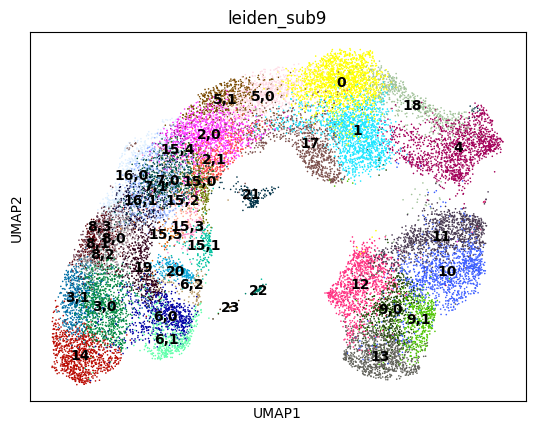

0       1731
1       1490
4       1334
10      1105
11      1093
12      1044
2,0     1010
13       962
14       936
3,0      875
17       796
5,0      779
7,0      690
6,0      673
9,0      615
18       586
3,1      564
7,1      556
16,0     550
5,1      530
19       511
9,1      503
6,1      486
2,1      432
8,0      382
8,1      328
15,0     284
16,1     256
8,2      250
20       239
15,1     183
21       176
8,3      160
15,2     134
15,3     111
6,2      107
15,4      92
15,5      51
22        38
23        11
Name: leiden_sub9, dtype: int64

In [10]:
res=0.2
sc.tl.leiden(adata, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata, color=new_key, legend_loc='on data')
adata.obs[new_key].value_counts()

categories: 0, 1, 2,0, etc.
var_group_labels: Ngn3 High early, Ngn3 High late


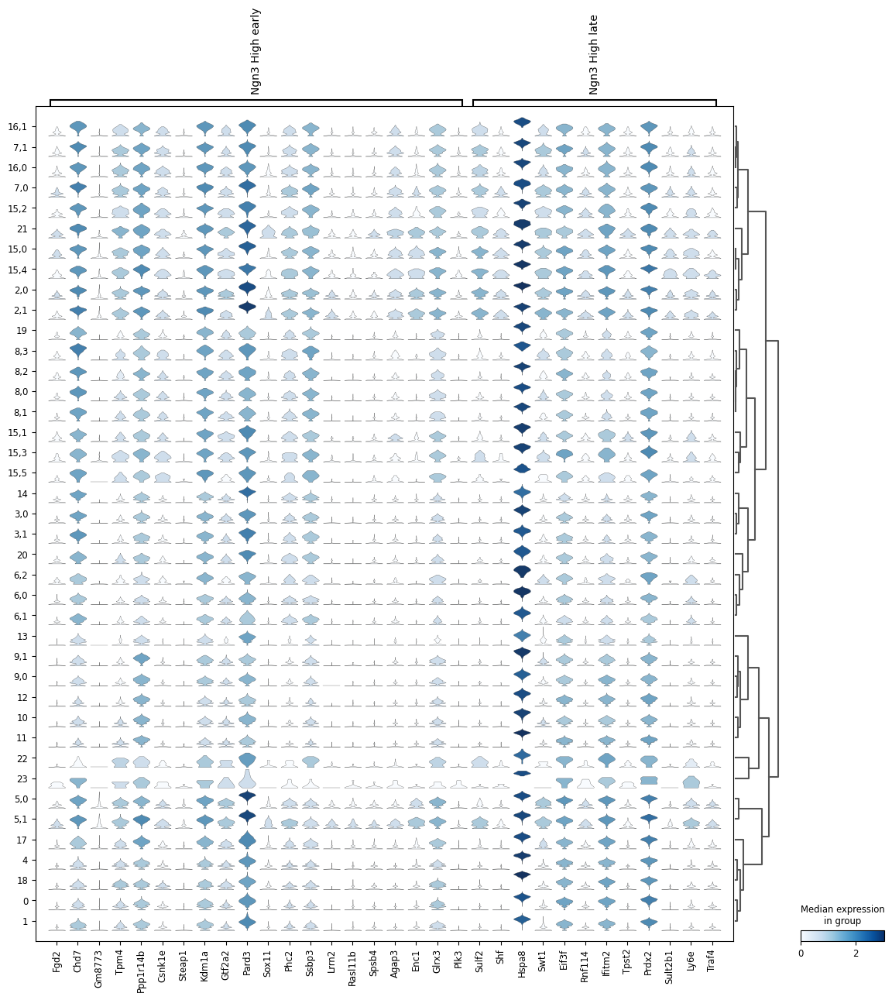

In [11]:
sc.pl.stacked_violin(adata, var_names={a:set(marker_genes_mouse2[a]).intersection(adata.var.index) for a in ['Ngn3 High early', 'Ngn3 High late']
}, groupby=new_key, dendrogram=True)

- 16,0: Ngn3 high
- 16,1: Ngn3 high


Subcluster 17

In [12]:
c_id = 17

In [13]:
init_clus_dict[str(c_id)]

['Ngn3 high']

In [14]:
orig_key = 'leiden_sub9'
new_key = 'leiden_sub10' 
new_rg_key = 'rg_sub10'
sub_key = str(c_id)

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


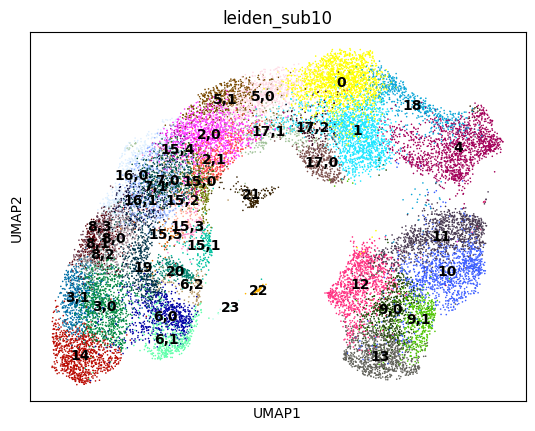

0       1731
1       1490
4       1334
10      1105
11      1093
12      1044
2,0     1010
13       962
14       936
3,0      875
5,0      779
7,0      690
6,0      673
9,0      615
18       586
3,1      564
7,1      556
16,0     550
5,1      530
19       511
9,1      503
6,1      486
2,1      432
8,0      382
17,0     353
8,1      328
17,1     300
15,0     284
16,1     256
8,2      250
20       239
15,1     183
21       176
8,3      160
17,2     143
15,2     134
15,3     111
6,2      107
15,4      92
15,5      51
22        38
23        11
Name: leiden_sub10, dtype: int64

In [15]:
res=0.2
sc.tl.leiden(adata, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata, color=new_key, legend_loc='on data')
adata.obs[new_key].value_counts()

categories: 0, 1, 2,0, etc.
var_group_labels: Ngn3 low EP, Ductal


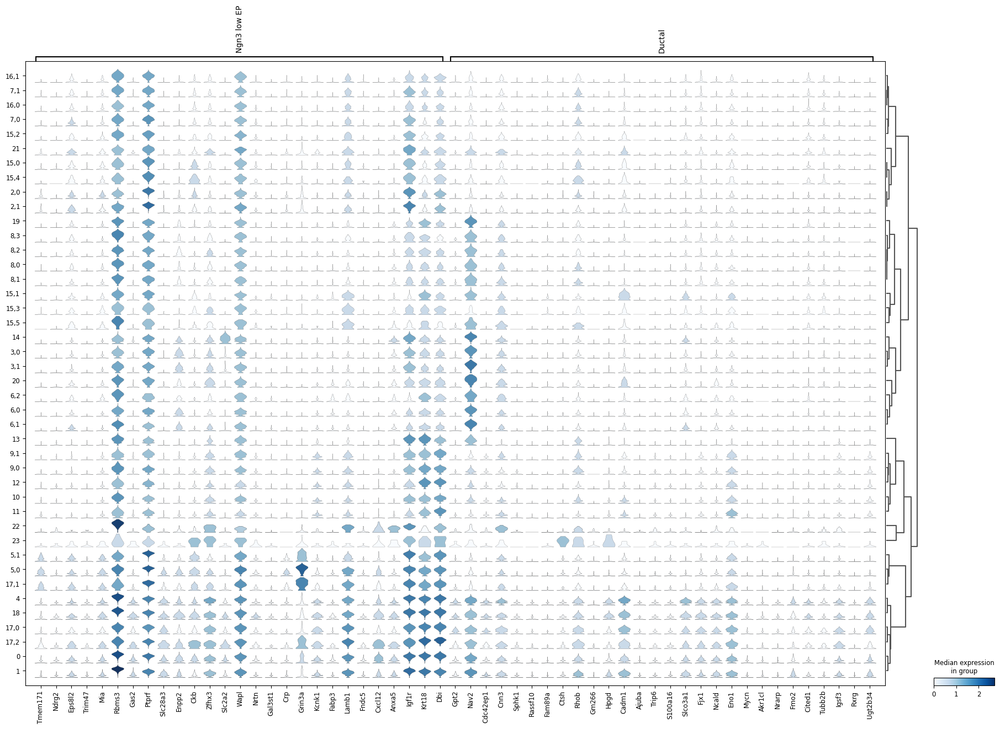

In [16]:
sc.pl.stacked_violin(adata, var_names={a:set(marker_genes_mouse2[a]).intersection(adata.var.index) for a in ['Ngn3 low EP', 'Ductal']
}, groupby=new_key, dendrogram=True)

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


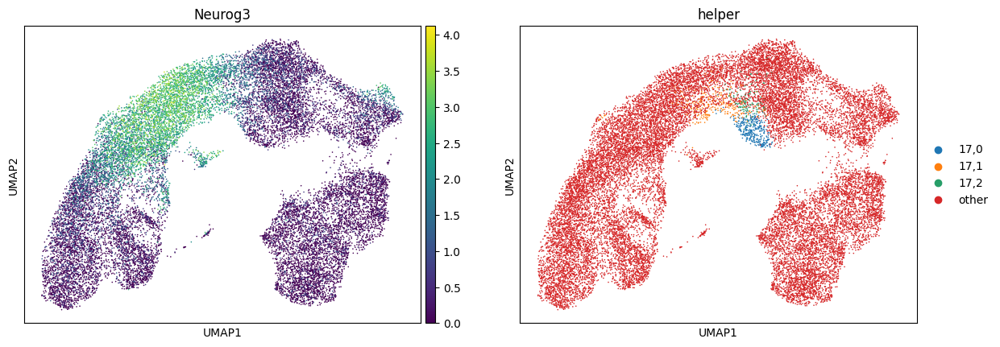

In [17]:
def help(x):
    if x[new_key] in ("17,0", "17,1", "17,2"):
        return x[new_key]
    return "other"
adata.obs["helper"] = adata.obs.apply(help, axis=1)
sc.pl.umap(adata, color=["Neurog3", "helper"])

- 17,0 Ductal
- 17,1 Ngn3 low
- 17,2 Ductal




Subcluster 19

In [18]:
c_id = 19

In [19]:
init_clus_dict[str(c_id)]

['Fev+ Alpha']

In [20]:
orig_key = 'leiden_sub10'
new_key = 'leiden_sub11' 
new_rg_key = 'rg_sub11'
sub_key = str(c_id)

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


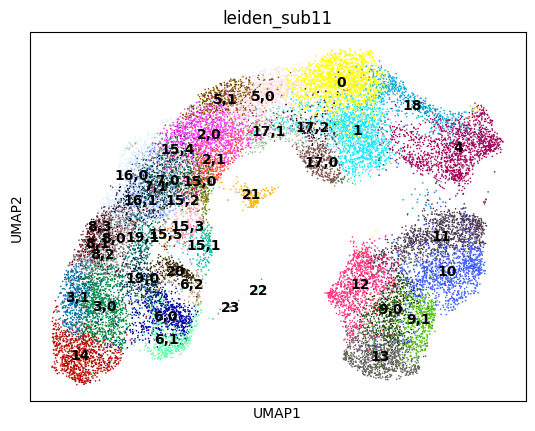

0       1731
1       1490
4       1334
10      1105
11      1093
12      1044
2,0     1010
13       962
14       936
3,0      875
5,0      779
7,0      690
6,0      673
9,0      615
18       586
3,1      564
7,1      556
16,0     550
5,1      530
9,1      503
6,1      486
2,1      432
8,0      382
17,0     353
19,0     333
8,1      328
17,1     300
15,0     284
16,1     256
8,2      250
20       239
15,1     183
19,1     178
21       176
8,3      160
17,2     143
15,2     134
15,3     111
6,2      107
15,4      92
15,5      51
22        38
23        11
Name: leiden_sub11, dtype: int64

In [21]:
res=0.2
sc.tl.leiden(adata, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata, color=new_key, legend_loc='on data')
adata.obs[new_key].value_counts()

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


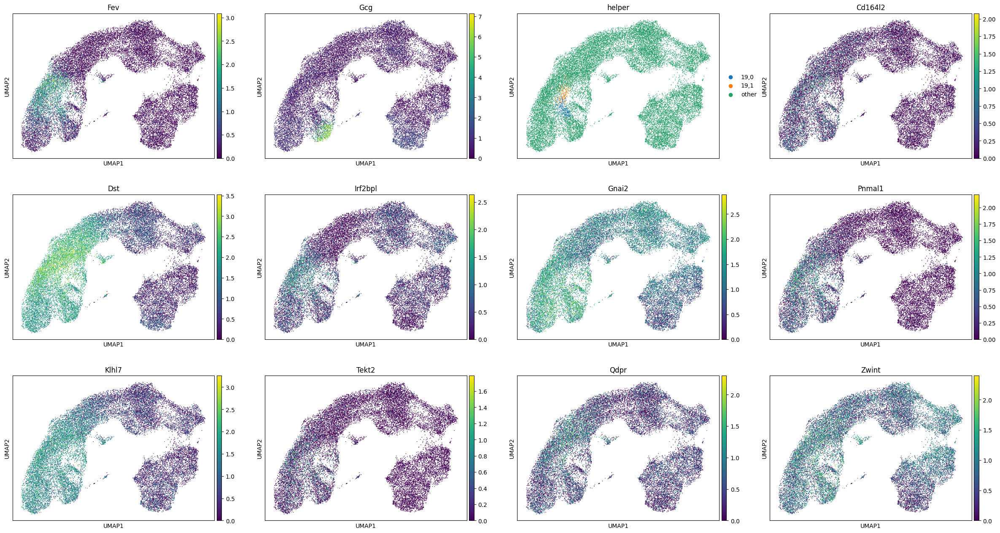

In [24]:
def help(x):
    if x[new_key] in ("19,0", "19,1"):
        return x[new_key]
    return "other"
adata.obs["helper"] = adata.obs.apply(help, axis=1)
sc.pl.umap(adata, color=["Fev", "Gcg", "helper"]+[el for el in marker_genes_mouse2['Fev+ Alpha'] if el in adata.var_names])

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


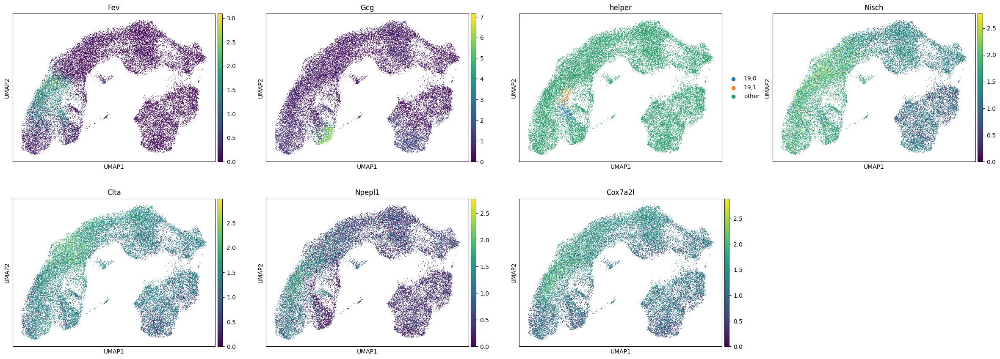

In [25]:
sc.pl.umap(adata, color=["Fev", "Gcg", "helper"]+[el for el in marker_genes_mouse2['Fev+ Beta'] if el in adata.var_names])

- 19,0: Fev+
- 19,1: Fev+ Alpha


Subcluster 20

In [26]:
c_id = 20

In [27]:
init_clus_dict[str(c_id)]

['Delta']

In [28]:
orig_key = 'leiden_sub11'
new_key = 'leiden_sub12' 
new_rg_key = 'rg_sub12'
sub_key = str(c_id)

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


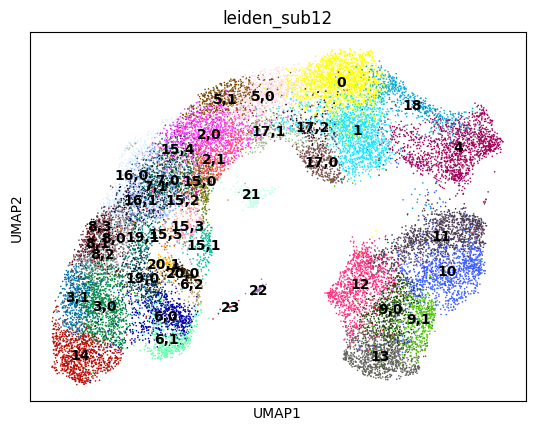

0       1731
1       1490
4       1334
10      1105
11      1093
12      1044
2,0     1010
13       962
14       936
3,0      875
5,0      779
7,0      690
6,0      673
9,0      615
18       586
3,1      564
7,1      556
16,0     550
5,1      530
9,1      503
6,1      486
2,1      432
8,0      382
17,0     353
19,0     333
8,1      328
17,1     300
15,0     284
16,1     256
8,2      250
15,1     183
19,1     178
21       176
8,3      160
20,0     155
17,2     143
15,2     134
15,3     111
6,2      107
15,4      92
20,1      84
15,5      51
22        38
23        11
Name: leiden_sub12, dtype: int64

In [29]:
res=0.2
sc.tl.leiden(adata, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata, color=new_key, legend_loc='on data')
adata.obs[new_key].value_counts()

categories: 0, 1, 2,0, etc.
var_group_labels: Delta


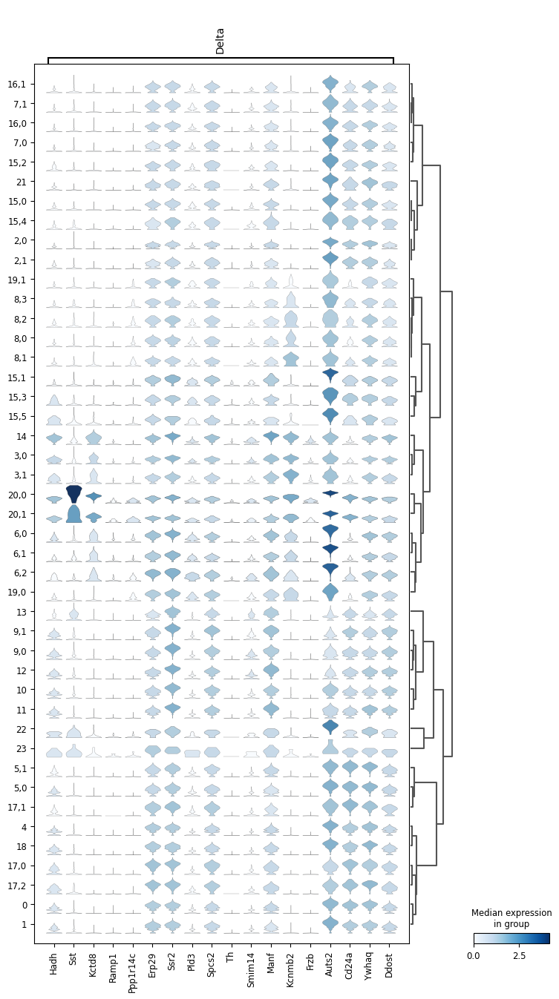

In [30]:
sc.pl.stacked_violin(adata, var_names={a:set(marker_genes_mouse2[a]).intersection(adata.var.index) for a in ['Delta']
}, groupby=new_key, dendrogram=True)

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


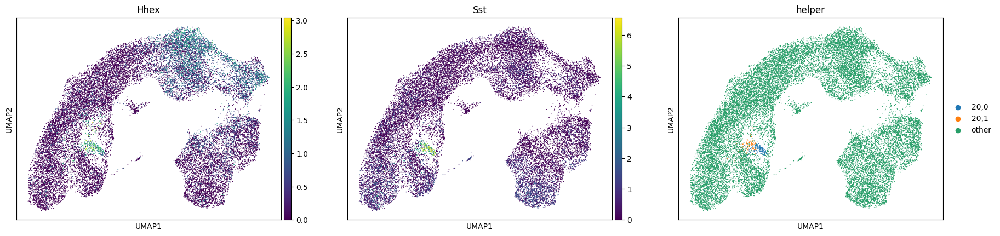

In [33]:
def help(x):
    if x[new_key] in ("20,0", "20,1"):
        return x[new_key]
    return "other"
adata.obs["helper"] = adata.obs.apply(help, axis=1)
sc.pl.umap(adata, color=["Hhex", "Sst", "helper"])

- 20,0: Delta
- 20,1: Delta

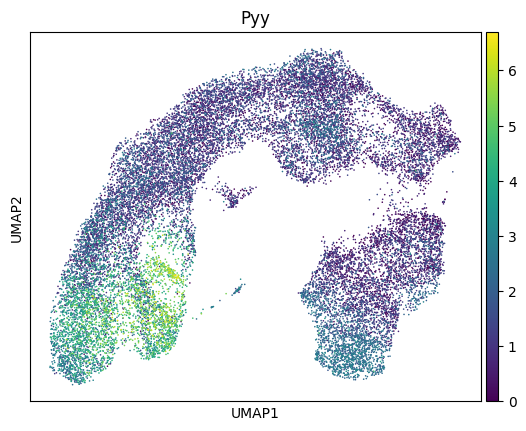

In [34]:
sc.pl.umap(adata, color="Pyy")

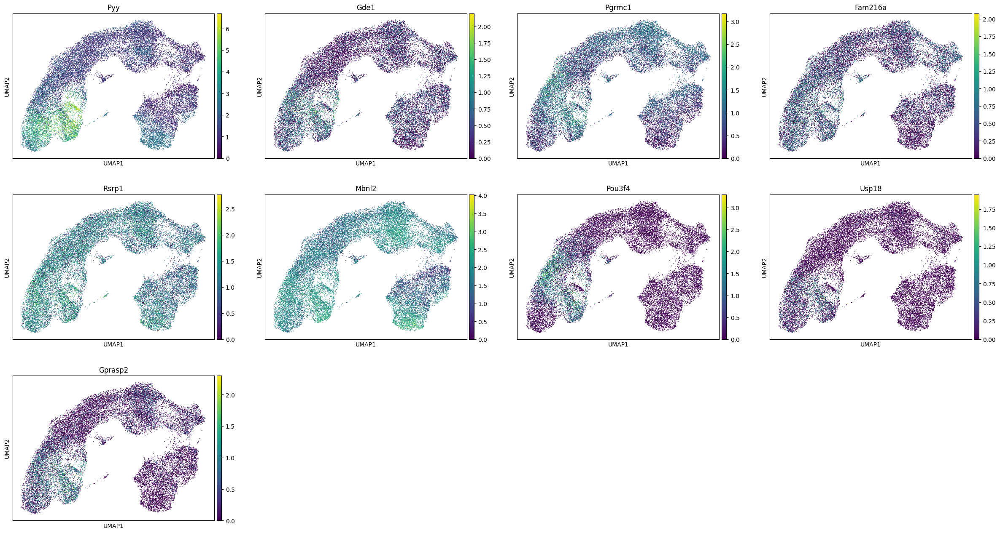

In [36]:
sc.pl.umap(adata, color=["Pyy"]+[el for el in marker_genes_mouse2['Fev+ Pyy'] if el in adata.var_names])

In [43]:
# note: Multipotent annotations are immature Acinar cells
# note: we do not distinguish between Ngn3 high late and Ngn3 high early

final_leiden = 'leiden_sub12'  

new_cluster_names = {
    
    "0": "Ductal",
    
    "1": "Ductal",
    
    "2,0": "Ngn3 high",
    "2,1": "Ngn3 high",
    
    "3,0": "Fev+ Beta",
    "3,1": "Fev+ Beta",
    
    "4": "Prlf. Ductal",
    
    "5,0": "Ngn3 low",
    "5,1": "Ngn3 low",
    
    "6,0": "Alpha",
    "6,1": "Alpha",
    "6,2": "Epsilon",
    
    "7,0": "Ngn3 high",
    "7,1": "Ngn3 high",
    
    "8,0": "Fev+",
    "8,1": "Fev+",
    "8,2": "Fev+",
    "8,3": "Fev+",
    
    "9,0": "Mat. Acinar",
    "9,1": "Mat. Acinar",
    
    "10": "Imm. Acinar",

    "11": "Imm. Acinar",

    "12": "Mat. Acinar",

    "13": "Mat. Acinar",

    "14": "Beta",
    
    "15,0": "Eps/Delta progenitors",
    "15,1": "Epsilon",
    "15,2": "Fev+ Delta,0",
    "15,3": "Fev+ Delta,1",
    "15,4": "Eps/Delta progenitors",
    "15,5": "Fev+ Delta,1",
    
    "16,0": "Ngn3 high",
    "16,1": "Ngn3 high",
    
    "17,0": "Ductal",
    "17,1": "Ngn3 low",
    "17,2": "Ductal",
    
    "18": "Prlf. Ductal",
    
    "19,0": "Fev+ Alpha",
    "19,1": "Fev+",

    "20,0": "Delta",
    "20,1": "Delta",

    "21": "Ngn3 high cycling",
    
    
}
ct_column = 'cell_type'
adata.obs[ct_column] = adata.obs[final_leiden].astype("str").values
for key in new_cluster_names.keys():
    adata.obs[ct_column][adata.obs[final_leiden]==key] = new_cluster_names[key]
adata.obs[ct_column] = adata.obs[ct_column].astype("category")

/tmp/ipykernel_1029309/85616073.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs[ct_column][adata.obs[final_leiden]==key] = new_cluster_names[key]
/tmp/ipykernel_1029309/85616073.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs[ct_column][adata.obs[final_leiden]==key] = new_cluster_names[key]
/tmp/ipykernel_1029309/85616073.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs[ct_column][adata.obs[f

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


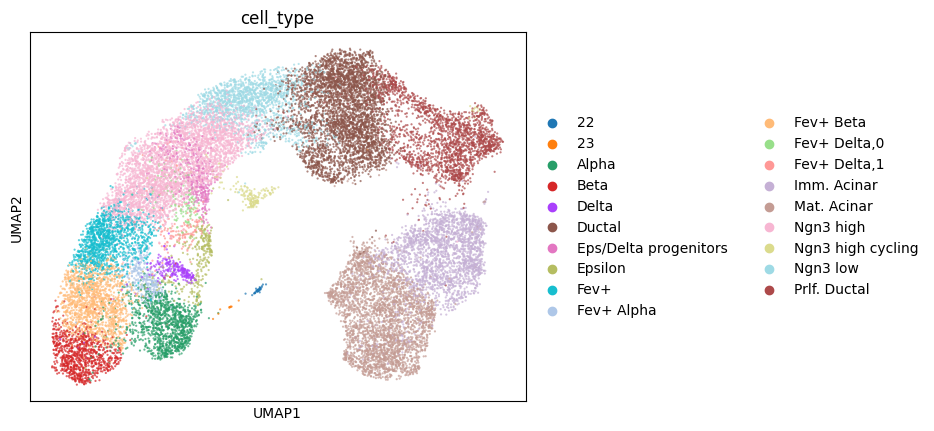

In [44]:
sc.pl.umap(adata, color=ct_column, size=10, add_outline=False, alpha=0.7, outline_width=(0.3, 0.0), color_map=ch_YlRd)

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


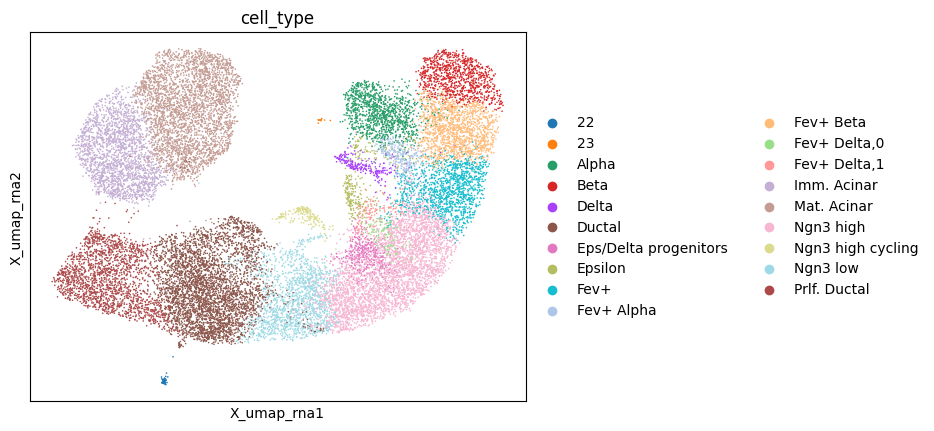

In [45]:
sc.pl.embedding(adata, color=ct_column, basis="X_umap_rna")

/home/icb/dominik.klein/mambaforge/envs/scvi-tools/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


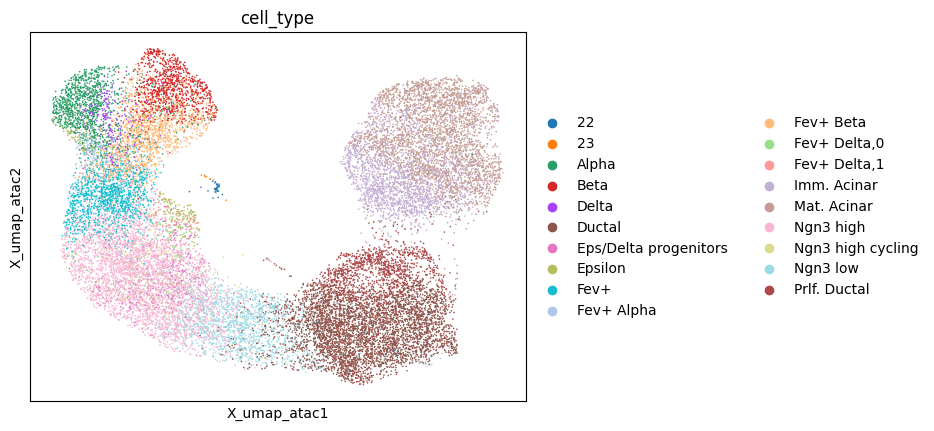

In [46]:
sc.pl.embedding(adata, color=ct_column, basis="X_umap_atac")

In [63]:
x,y = 'sample', 'cell_type'
df = adata.obs.copy()
df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

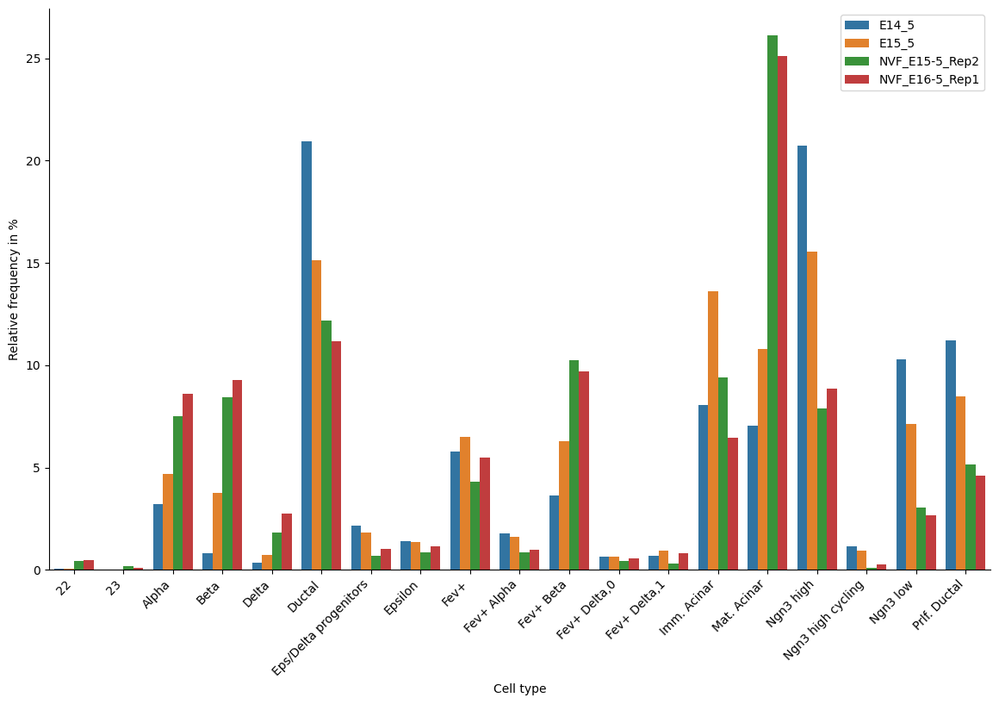

In [67]:
import seaborn as sns

g = sns.catplot(df1, x="cell_type", y="percent", hue="sample",kind='bar',legend=False,height=8.27, aspect=11.7/8.27)
plt.xlabel("Cell type")
plt.ylabel("Relative frequency in %")
plt.xticks(rotation=45, ha='right')
plt.legend(loc='upper right')
plt.tight_layout()


In [70]:
x,y = 'stage', 'cell_type'
df = adata.obs.copy()
df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

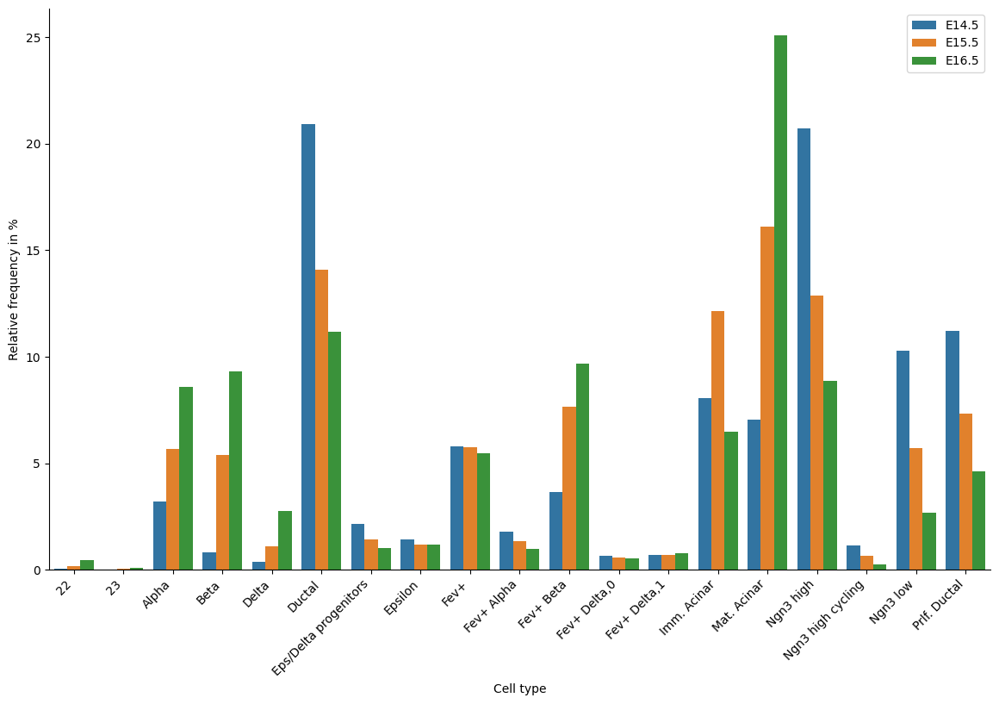

In [71]:
import seaborn as sns

g = sns.catplot(df1, x="cell_type", y="percent", hue="stage",kind='bar',legend=False,height=8.27, aspect=11.7/8.27)
plt.xlabel("Cell type")
plt.ylabel("Relative frequency in %")
plt.xticks(rotation=45, ha='right')
plt.legend(loc='upper right')
plt.tight_layout()


In [72]:
adata.write("/lustre/groups/ml01/workspace/moscot_paper/pancreas_revision/adata_annotation_4.h5ad")